In [1]:
import os
import sys
import numpy as np
import re
import pandas as pd
from matplotlib import pyplot as plt

In [2]:
df = pd.read_csv('E:/DS5500_Project/features_v2.csv')

In [3]:
# features = ['power', 'peak', 'p2p', 'crest_factor', 'skew', 'kurtosis', 'form_factor', 'pulse_indicator']
features = ['iemg', 'mav', 'ssi', 'myopulse', 'wflen', 'diffvar', 'dasd', 'willison']

subscript = ['F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11',
             'F12', 'F13', 'F14', 'F15', 'F16', 'W1', 'W2', 'W3', 'W4', 'W5', 'W6',
             'W7', 'W8', 'W9', 'W10', 'W11', 'W12']

In [4]:
cols = ['session', 'participant', 'gesture']
for feat in features:
    for sub in subscript:
        cols.append(str(feat + '_' + sub))

In [5]:
df_multiplevalues = df[cols]

In [6]:
grouped = df_multiplevalues.groupby(df_multiplevalues.session)
df_mvsession1 = grouped.get_group(1)
df_mvsession2 = grouped.get_group(2)
df_mvsession3 = grouped.get_group(3)

In [7]:
df_multiplevalues

,session,participant,gesture,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
0,1,1,10,365.456658,486.252097,572.299915,549.591476,596.688570,574.351904,410.868562,...,29.0,12.0,30.0,4.0,24.0,43.0,15.0,29.0,30.0,10.0
1,1,1,10,379.664639,457.206529,548.815290,594.159933,559.894617,459.996848,388.098418,...,37.0,28.0,47.0,31.0,50.0,65.0,23.0,35.0,50.0,24.0
2,1,1,10,296.823135,366.035801,436.432942,531.145847,481.620236,382.404329,284.254639,...,14.0,10.0,32.0,8.0,28.0,36.0,13.0,15.0,37.0,15.0
3,1,1,10,479.688214,558.665048,692.697258,843.069979,819.798016,820.821694,489.015368,...,1.0,0.0,26.0,1.0,7.0,2.0,0.0,4.0,27.0,0.0
4,1,1,10,464.350257,577.728029,689.459354,779.777308,870.771601,807.715357,463.839761,...,8.0,1.0,35.0,2.0,13.0,10.0,3.0,4.0,36.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15346,3,9,9,274.024844,222.095617,219.667820,195.086508,197.057701,235.316875,335.034153,...,0.0,0.0,4.0,5.0,0.0,1.0,2.0,1.0,1.0,1.0
15347,3,9,9,385.695263,419.278933,377.568827,276.863674,272.157391,368.207472,478.991161,...,0.0,0.0,0.0,9.0,0.0,1.0,0.0,0.0,0.0,2.0
15348,3,9,9,389.039490,376.847559,374.724614,308.042887,307.784003,421.139826,550.021742,...,0.0,0.0,0.0,4.0,0.0,4.0,0.0,0.0,0.0,2.0
15349,3,9,9,319.503197,268.649477,265.248414,270.291325,291.993621,401.155638,500.411552,...,0.0,0.0,5.0,10.0,0.0,29.0,0.0,0.0,0.0,5.0


In [8]:
df_mvsession1

,session,participant,gesture,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
0,1,1,10,365.456658,486.252097,572.299915,549.591476,596.688570,574.351904,410.868562,...,29.0,12.0,30.0,4.0,24.0,43.0,15.0,29.0,30.0,10.0
1,1,1,10,379.664639,457.206529,548.815290,594.159933,559.894617,459.996848,388.098418,...,37.0,28.0,47.0,31.0,50.0,65.0,23.0,35.0,50.0,24.0
2,1,1,10,296.823135,366.035801,436.432942,531.145847,481.620236,382.404329,284.254639,...,14.0,10.0,32.0,8.0,28.0,36.0,13.0,15.0,37.0,15.0
3,1,1,10,479.688214,558.665048,692.697258,843.069979,819.798016,820.821694,489.015368,...,1.0,0.0,26.0,1.0,7.0,2.0,0.0,4.0,27.0,0.0
4,1,1,10,464.350257,577.728029,689.459354,779.777308,870.771601,807.715357,463.839761,...,8.0,1.0,35.0,2.0,13.0,10.0,3.0,4.0,36.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5112,1,9,9,433.047361,322.661210,299.285056,281.614258,242.388910,278.676599,332.117758,...,0.0,0.0,70.0,78.0,5.0,13.0,0.0,0.0,50.0,5.0
5113,1,9,9,276.059966,208.009991,196.397116,175.851316,180.153125,247.575395,291.554415,...,0.0,0.0,31.0,51.0,1.0,12.0,0.0,0.0,24.0,8.0
5114,1,9,9,311.168664,324.042794,296.619199,327.511702,288.739010,334.066005,380.731897,...,0.0,0.0,18.0,30.0,1.0,11.0,0.0,0.0,13.0,3.0
5115,1,9,9,466.597768,338.712080,281.519096,266.502987,238.942851,315.347512,403.399163,...,0.0,0.0,64.0,61.0,4.0,1.0,0.0,0.0,41.0,6.0


In [9]:
df_mvsession2

,session,participant,gesture,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
5117,2,1,10,482.947989,561.598599,649.364252,751.879465,838.012267,872.366432,550.887703,...,22.0,7.0,26.0,11.0,3.0,26.0,20.0,23.0,45.0,20.0
5118,2,1,10,505.768799,580.952517,681.376780,818.409161,880.536932,862.519413,554.068406,...,15.0,3.0,26.0,6.0,12.0,25.0,17.0,9.0,42.0,9.0
5119,2,1,10,475.720029,554.315050,636.977135,727.575103,789.478577,780.889498,510.010216,...,17.0,5.0,18.0,12.0,13.0,25.0,11.0,6.0,47.0,19.0
5120,2,1,10,533.312175,649.005045,741.908679,801.563662,889.642830,868.226237,582.803073,...,25.0,7.0,19.0,9.0,34.0,35.0,28.0,7.0,35.0,19.0
5121,2,1,10,387.338216,452.914307,505.840959,581.576434,762.199947,820.582872,463.448810,...,4.0,0.0,11.0,4.0,1.0,4.0,4.0,2.0,28.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10229,2,9,9,293.176774,446.310655,335.203182,301.169140,294.082124,384.090487,253.187188,...,1.0,1.0,1.0,30.0,3.0,7.0,0.0,2.0,6.0,11.0
10230,2,9,9,256.472024,255.170898,233.472574,211.160873,258.343339,491.840071,273.162124,...,1.0,2.0,8.0,66.0,2.0,14.0,0.0,3.0,5.0,31.0
10231,2,9,9,282.538350,297.563440,258.591141,231.738467,266.129528,520.812009,251.099740,...,3.0,1.0,0.0,18.0,1.0,5.0,1.0,3.0,3.0,10.0
10232,2,9,9,369.698550,332.751894,300.675423,266.823841,241.615114,383.478285,212.246778,...,6.0,7.0,82.0,109.0,14.0,29.0,2.0,9.0,14.0,70.0


In [10]:
df_mvsession3

,session,participant,gesture,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
10234,3,1,10,302.624721,371.970993,412.782933,490.473688,552.725391,540.030172,363.024370,...,11.0,7.0,47.0,17.0,17.0,26.0,11.0,13.0,35.0,22.0
10235,3,1,10,265.514407,383.827428,397.926794,408.388278,416.502606,370.878304,273.202075,...,28.0,10.0,58.0,16.0,52.0,74.0,33.0,12.0,51.0,7.0
10236,3,1,10,363.451066,385.656965,437.858804,493.245807,543.999569,687.110655,581.901229,...,6.0,7.0,34.0,7.0,33.0,13.0,3.0,3.0,43.0,17.0
10237,3,1,10,271.457971,373.443449,418.117319,480.306019,502.414335,425.186639,296.957309,...,16.0,9.0,80.0,20.0,13.0,20.0,14.0,6.0,41.0,33.0
10238,3,1,10,239.670349,323.948260,343.472078,360.307686,387.212258,356.798584,256.955042,...,22.0,13.0,51.0,9.0,50.0,50.0,20.0,6.0,46.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15346,3,9,9,274.024844,222.095617,219.667820,195.086508,197.057701,235.316875,335.034153,...,0.0,0.0,4.0,5.0,0.0,1.0,2.0,1.0,1.0,1.0
15347,3,9,9,385.695263,419.278933,377.568827,276.863674,272.157391,368.207472,478.991161,...,0.0,0.0,0.0,9.0,0.0,1.0,0.0,0.0,0.0,2.0
15348,3,9,9,389.039490,376.847559,374.724614,308.042887,307.784003,421.139826,550.021742,...,0.0,0.0,0.0,4.0,0.0,4.0,0.0,0.0,0.0,2.0
15349,3,9,9,319.503197,268.649477,265.248414,270.291325,291.993621,401.155638,500.411552,...,0.0,0.0,5.0,10.0,0.0,29.0,0.0,0.0,0.0,5.0


In [11]:
avg_session = df_multiplevalues.groupby('gesture').mean()
avg_session = avg_session.drop(columns=['session', 'participant'])
avg_session

,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,iemg_F8,iemg_F9,iemg_F10,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
gesture,,,,,,,,,,,,,,,,,,,,,
1,368.544543,445.985325,508.942468,593.734707,499.211281,474.373395,556.636399,378.754642,402.472411,472.793655,...,11.459579,9.179402,18.674419,22.187154,18.566999,11.419712,11.421927,11.828350,16.130676,23.897010
2,321.499817,338.138888,339.447365,352.378309,385.487570,620.826084,544.391142,347.963631,368.316156,354.094726,...,5.863787,6.751938,28.055371,53.971207,15.075305,8.139535,4.137320,10.579181,21.980066,24.511628
3,319.112617,334.052386,315.169683,317.517143,361.919017,749.539932,640.238379,369.818615,360.362084,347.298146,...,6.548173,5.712071,19.895903,36.675526,11.898117,11.469546,4.460687,10.694352,16.662237,19.590255
4,397.696851,404.330772,426.659868,435.201768,474.404245,750.284640,705.840793,466.800424,426.365576,419.215875,...,8.710963,7.266888,10.222591,20.265781,17.487265,14.495017,8.231451,10.633444,12.125138,11.647841
5,309.964830,466.683755,500.416632,432.248476,453.953503,494.454637,405.616074,285.276547,358.751693,502.814218,...,4.645626,4.063123,11.737542,7.733112,7.782946,8.456257,2.688815,6.582503,17.743079,6.892580
6,290.288097,439.823745,476.501360,372.954398,488.440129,719.482889,398.798965,277.582728,341.446183,479.206422,...,10.024363,9.000000,14.286822,9.323367,24.351052,14.449612,8.493909,11.609081,19.241417,8.527132
7,418.801215,451.309836,463.362716,443.405563,495.437517,731.434279,741.462697,492.517257,452.589387,471.300596,...,8.325581,7.916944,24.467331,44.605759,15.854928,19.053156,6.394241,12.565891,18.465116,21.901440
8,278.872668,333.707836,349.712393,325.030290,417.298384,671.613564,446.463781,297.322690,328.897959,363.273143,...,9.414175,10.045404,27.366556,50.383167,24.294574,9.495017,10.258029,13.019934,24.561462,25.297896
9,249.577887,331.033870,348.353231,333.092156,327.868589,399.264467,373.960174,250.651469,297.699160,358.113628,...,4.780731,4.215947,14.614618,31.533776,9.890365,7.834994,2.883721,7.294574,10.366556,12.470653


In [12]:
avg_session1 = df_mvsession1.groupby('gesture').mean()
avg_session1 = avg_session1.drop(columns=['session', 'participant'])
avg_session1

,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,iemg_F8,iemg_F9,iemg_F10,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
gesture,,,,,,,,,,,,,,,,,,,,,
1,393.576070,465.872196,540.680014,619.969407,520.479085,494.029516,570.289499,405.040898,427.788034,492.523893,...,12.401993,8.398671,17.461794,18.558140,19.186047,11.438538,11.116279,11.584718,16.029900,35.036545
2,324.406983,342.806666,342.050944,351.147379,375.556813,609.799087,561.871091,350.415730,375.376898,360.045445,...,5.558140,5.913621,29.664452,53.405316,14.880399,7.697674,4.219269,10.475083,22.475083,25.162791
3,335.031782,345.315663,330.666415,328.480471,363.778883,745.512231,683.441908,388.835499,378.430030,363.349285,...,6.219269,4.734219,20.305648,34.714286,11.651163,12.611296,4.196013,10.857143,17.405316,20.036545
4,403.687521,409.134457,433.935589,440.907634,470.924979,741.459463,733.873793,477.707234,434.402554,426.007623,...,15.481728,9.840532,10.102990,21.504983,23.950166,19.700997,14.421927,17.063123,16.990033,18.285714
5,329.756945,494.074438,550.091126,459.699725,464.911538,520.499644,450.036551,311.164777,385.734905,529.598244,...,4.458472,3.823920,10.149502,6.920266,7.388704,8.803987,2.607973,7.820598,17.023256,6.837209
6,299.449397,449.628160,515.745130,381.637611,477.447560,721.349405,415.197565,288.491043,353.276236,484.292541,...,10.289037,8.724252,14.179402,8.996678,26.441860,13.730897,9.239203,11.880399,19.747508,9.976744
7,428.710064,457.462838,490.856955,451.325400,499.128348,738.233616,786.738139,509.606327,465.957461,489.334139,...,9.671096,8.142857,26.255814,45.368771,16.013289,21.358804,7.667774,14.166113,20.837209,26.880399
8,289.930475,344.807920,374.281500,337.370374,419.297449,681.692263,460.040104,307.207727,344.800729,376.787907,...,13.717608,9.737542,24.132890,45.109635,23.471761,11.461794,16.285714,16.189369,24.299003,28.209302
9,275.546876,351.125907,381.792251,359.591474,353.042314,419.458909,415.181195,275.721423,328.847951,381.198293,...,4.249169,3.644518,13.149502,29.365449,9.624585,8.136213,2.936877,8.651163,9.621262,11.996678


In [13]:
avg_session2 = df_mvsession2.groupby('gesture').mean()
avg_session2 = avg_session2.drop(columns=['session', 'participant'])
avg_session2

,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,iemg_F8,iemg_F9,iemg_F10,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
gesture,,,,,,,,,,,,,,,,,,,,,
1,373.468929,458.060570,509.500285,600.697238,513.429999,483.524625,566.047737,382.342097,409.432113,483.531747,...,9.910299,8.541528,16.717608,21.073090,16.169435,10.063123,9.797342,10.156146,15.239203,14.710963
2,314.651586,332.644633,336.616038,350.595883,387.614135,629.766623,550.543058,347.700617,363.108185,350.471262,...,5.893688,6.229236,25.950166,56.534884,16.408638,7.887043,3.860465,9.561462,21.235880,22.578073
3,311.072215,326.980356,311.434899,313.651089,359.567326,775.708761,637.790542,367.317996,356.532040,343.356258,...,5.342193,5.000000,15.199336,39.162791,11.425249,9.468439,3.704319,10.023256,12.923588,16.245847
4,383.887929,395.297922,420.180498,426.705292,471.076894,766.000837,699.065278,456.856647,416.371077,410.636558,...,5.521595,5.149502,8.461794,21.063123,13.830565,11.222591,5.112957,7.066445,9.418605,6.817276
5,307.190720,466.934738,493.563149,425.898155,467.473060,496.719968,395.714373,282.769193,354.243228,499.982976,...,4.541528,4.109635,9.501661,7.764120,6.966777,7.156146,2.538206,3.551495,15.800664,6.053156
6,293.431175,447.503670,476.416838,380.732943,511.697217,746.301535,412.114438,282.532001,345.182736,488.449303,...,9.039867,7.973422,12.840532,9.252492,20.774086,12.109635,7.262458,9.730897,17.485050,6.936877
7,392.994768,430.417452,438.890415,419.375749,475.401395,725.377565,713.929358,468.788079,428.488278,450.404331,...,7.654485,7.578073,20.242525,45.697674,16.305648,18.378738,5.611296,10.767442,16.215947,16.634551
8,275.262025,336.162056,350.457695,327.301566,432.552938,698.882832,454.581180,299.032845,326.872752,366.784599,...,6.066445,8.933555,22.435216,52.478405,23.235880,6.843854,6.136213,10.205980,22.126246,21.890365
9,239.245393,327.551150,340.016738,324.158729,321.269392,408.219010,361.647155,245.532040,287.189057,353.546864,...,4.588040,4.162791,11.504983,31.581395,10.295681,7.112957,2.551495,4.232558,10.574751,10.568106


In [14]:
avg_session3 = df_mvsession3.groupby('gesture').mean()
avg_session3 = avg_session3.drop(columns=['session', 'participant'])
avg_session3

,iemg_F1,iemg_F2,iemg_F3,iemg_F4,iemg_F5,iemg_F6,iemg_F7,iemg_F8,iemg_F9,iemg_F10,...,willison_W3,willison_W4,willison_W5,willison_W6,willison_W7,willison_W8,willison_W9,willison_W10,willison_W11,willison_W12
gesture,,,,,,,,,,,,,,,,,,,,,
1,338.588629,414.023207,476.647107,560.537477,463.724759,445.566045,533.571962,348.880930,370.197085,442.325325,...,12.066445,10.598007,21.843854,26.930233,20.345515,12.757475,13.352159,13.744186,17.122924,21.943522
2,325.440883,338.965364,339.675112,355.391666,393.291762,622.912543,520.759279,345.774547,366.463385,351.767471,...,6.139535,8.112957,28.551495,51.973422,13.936877,8.833887,4.332226,11.700997,22.229236,25.794020
3,311.233856,329.861138,303.407736,310.419870,362.410843,727.398804,599.482686,353.302349,346.124183,335.188894,...,8.083056,7.401993,24.182724,36.149502,12.617940,12.328904,5.481728,11.202658,19.657807,22.488372
4,405.515103,408.559938,425.863518,437.992379,481.210861,743.393619,684.583310,465.837390,428.323097,421.003444,...,5.129568,6.810631,12.102990,18.229236,14.681063,12.561462,5.159468,7.770764,9.966777,9.840532
5,292.946824,439.042090,457.595623,411.147549,429.475911,466.144299,371.097297,261.895670,336.276944,478.861435,...,4.936877,4.255814,15.561462,8.514950,8.993355,9.408638,2.920266,8.375415,20.405316,7.787375
6,277.983719,422.339405,437.342113,356.492641,476.175609,690.797727,369.084894,261.725141,325.879575,464.877421,...,10.744186,10.302326,15.840532,9.720930,25.837209,17.508306,8.980066,13.215947,20.491694,8.667774
7,434.698813,466.049217,460.340777,459.515541,511.782807,730.691656,723.720595,499.157366,463.322421,474.163318,...,7.651163,8.029900,26.903654,42.750831,15.245847,17.421927,5.903654,12.764120,18.342193,22.189369
8,271.425505,320.153530,324.397983,310.418930,400.044765,634.265598,424.770058,285.727498,315.020395,346.246925,...,8.458472,11.465116,35.531561,53.561462,26.176080,10.179402,8.352159,12.664452,27.259136,25.794020
9,233.941392,314.424551,323.250704,315.526267,309.294062,370.115483,345.052172,230.700944,277.060473,339.595727,...,5.504983,4.840532,19.189369,33.654485,9.750831,8.255814,3.162791,9.000000,10.903654,14.847176


In [15]:
mylabels_forearm_ring1 = ['f1', 'f2', 'f3', 'f4',
                          'f5', 'f6', 'f7', 'f8']

mylabels_forearm_ring2 = ['f9', 'f10', 'f11', 'f12',
                          'f13', 'f14', 'f15', 'f16']

mylabels_wrist_ring3 = ['w1', 'w2', 'w3',
                        'w4', 'w5', 'w6', ]

mylabels_wrist_ring4 = ['w7', 'w8', 'w9', 
                        'w10', 'w11', 'w12']

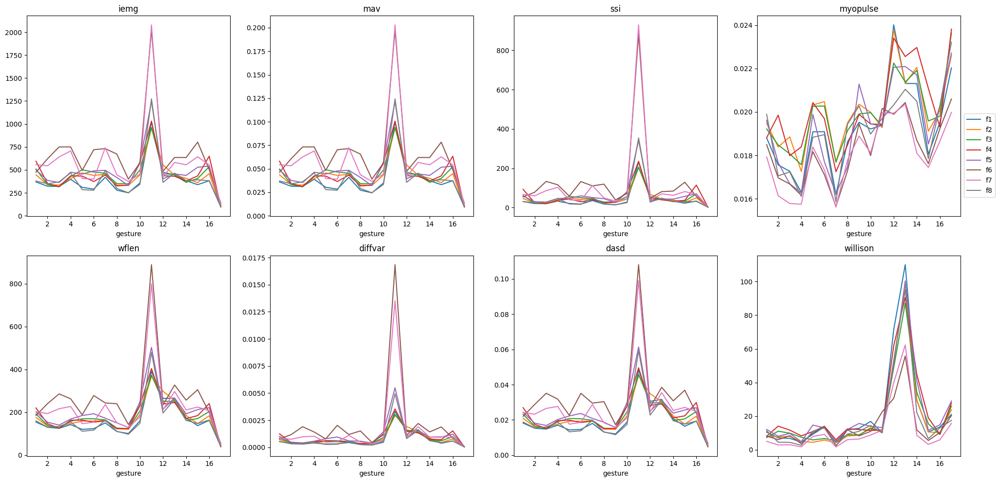

In [17]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, :8].plot(ax = axes[0][0])
avg_session.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

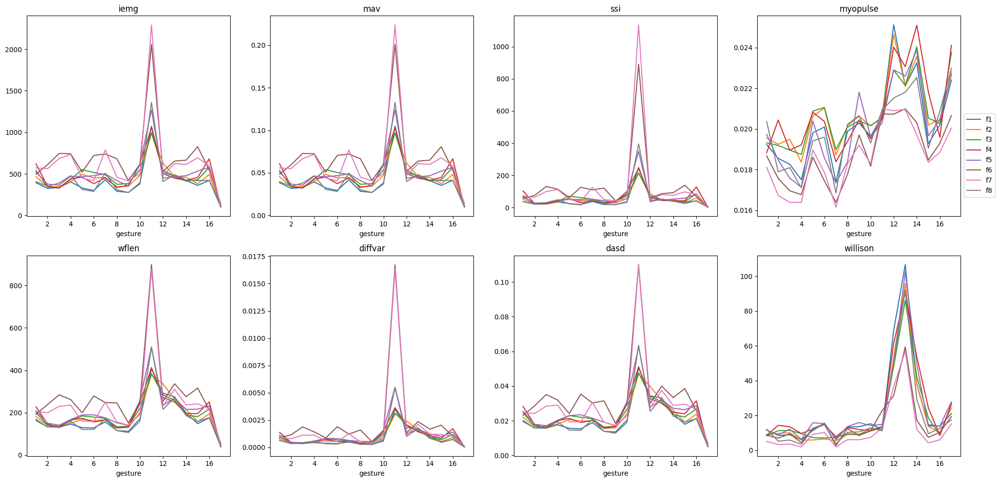

In [18]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, :8].plot(ax = axes[0][0])
avg_session1.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session1.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session1.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session1.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session1.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session1.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session1.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

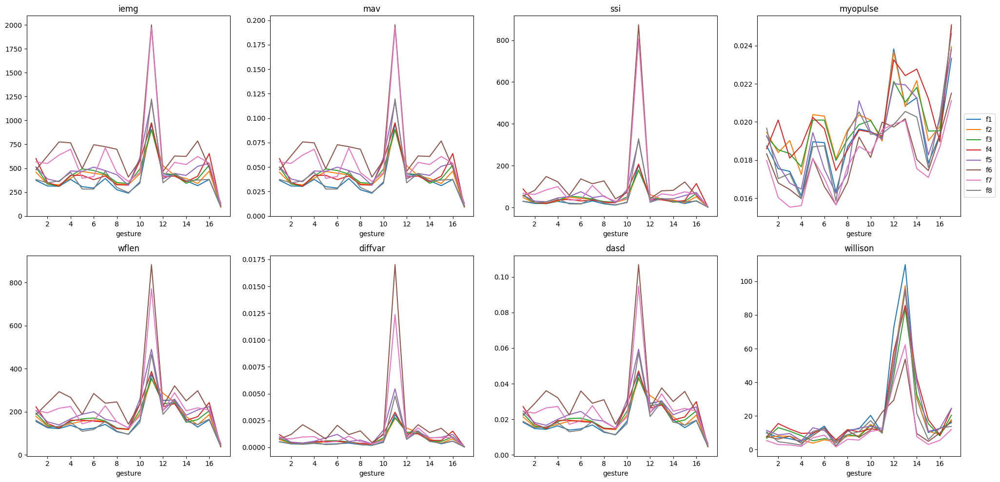

In [19]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, :8].plot(ax = axes[0][0])
avg_session2.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session2.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session2.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session2.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session2.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session2.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session2.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

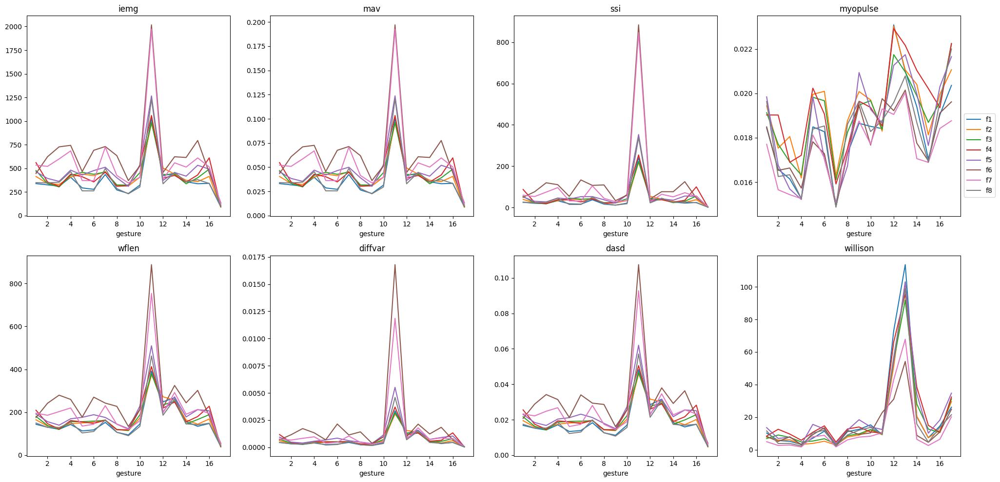

In [20]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, :8].plot(ax = axes[0][0])
avg_session3.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session3.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session3.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session3.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session3.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session3.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session3.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

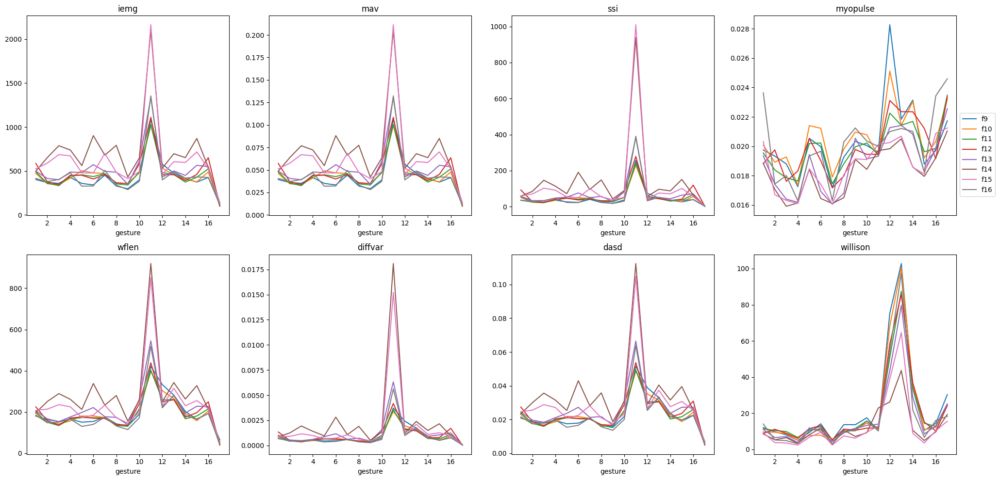

In [21]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

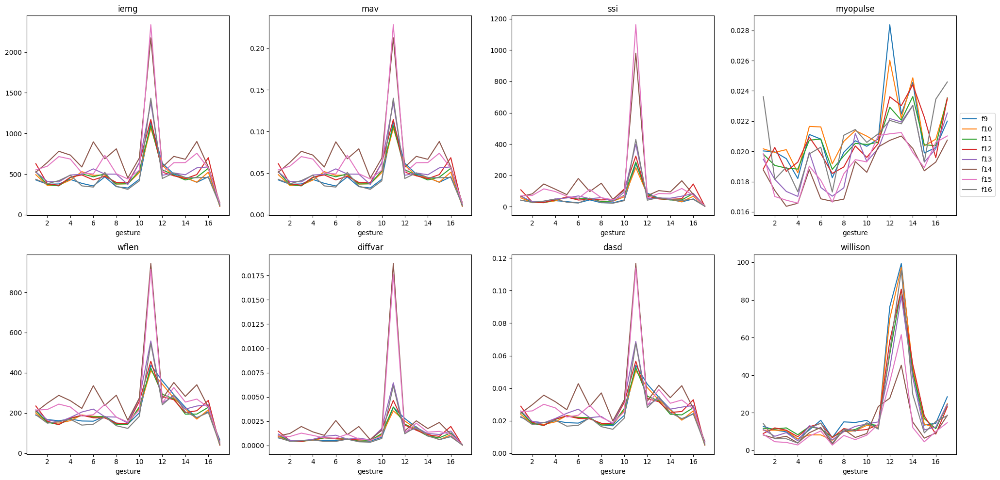

In [22]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session1.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session1.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session1.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session1.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session1.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session1.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session1.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

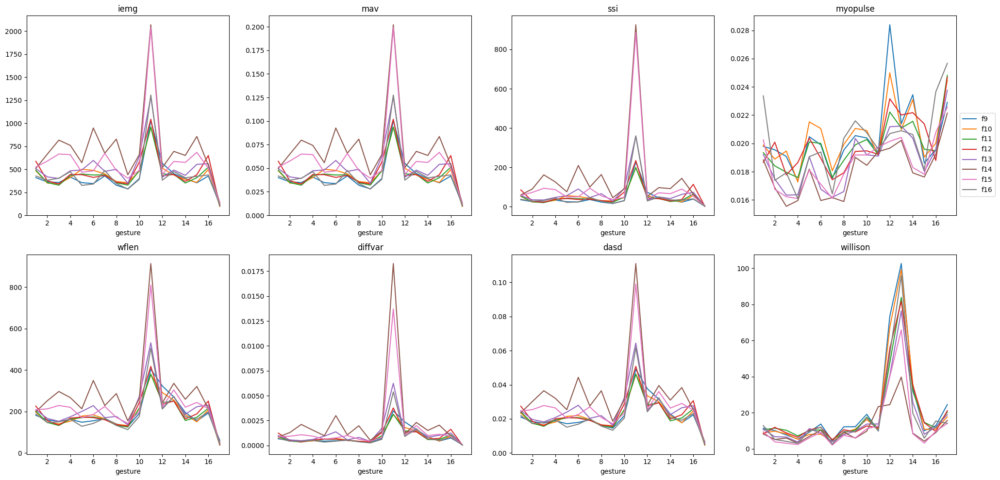

In [23]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session2.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session2.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session2.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session2.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session2.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session2.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session2.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

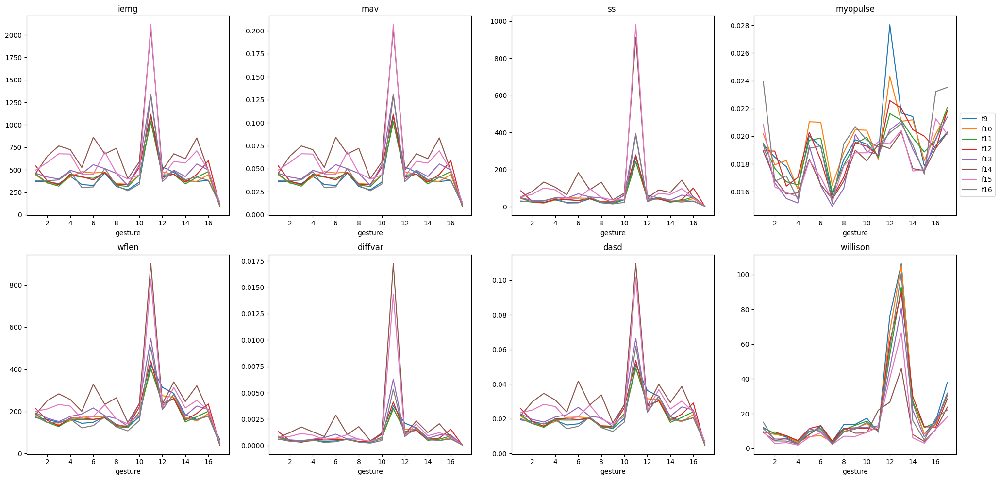

In [24]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session3.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session3.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session3.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session3.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session3.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session3.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session3.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

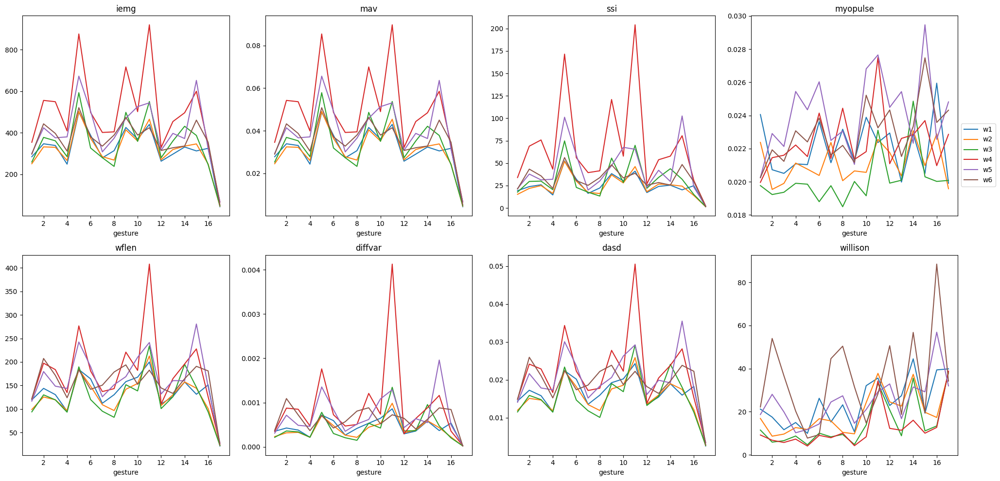

In [25]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

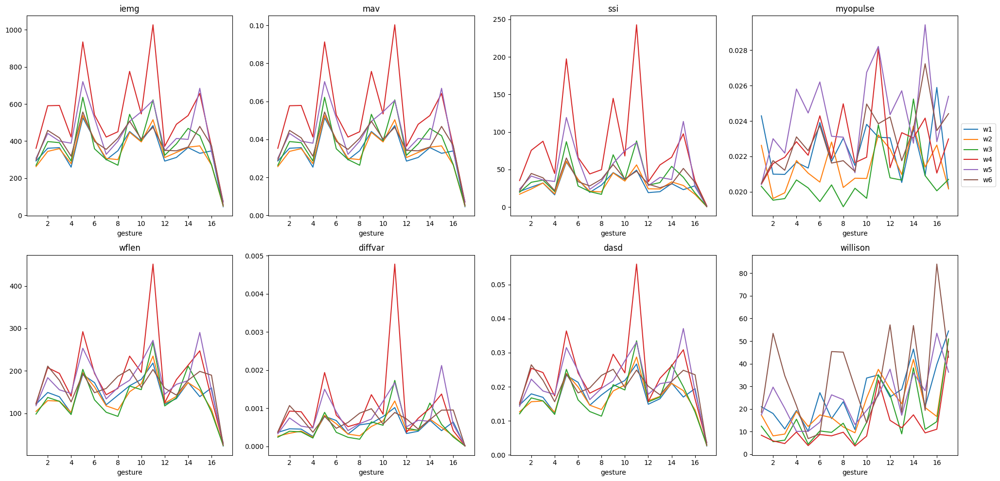

In [26]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session1.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session1.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session1.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session1.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session1.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session1.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session1.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

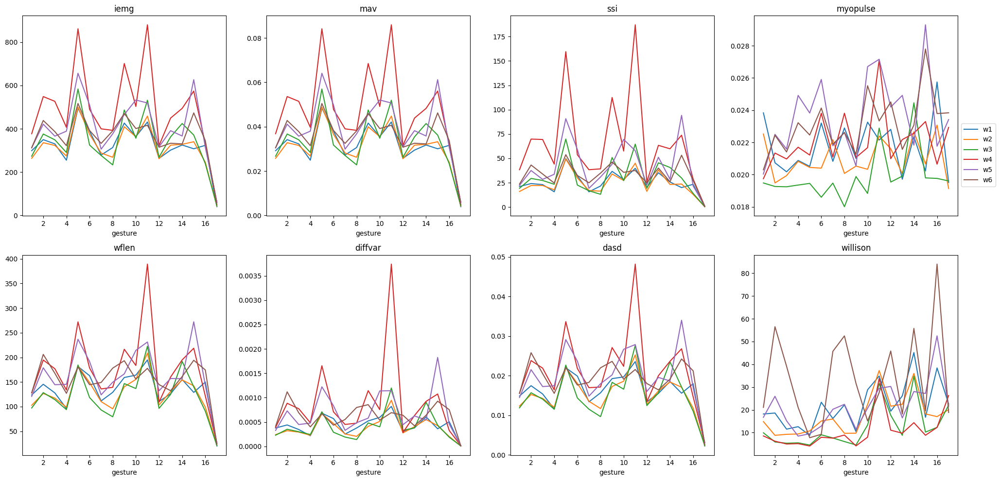

In [27]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session2.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session2.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session2.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session2.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session2.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session2.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session2.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

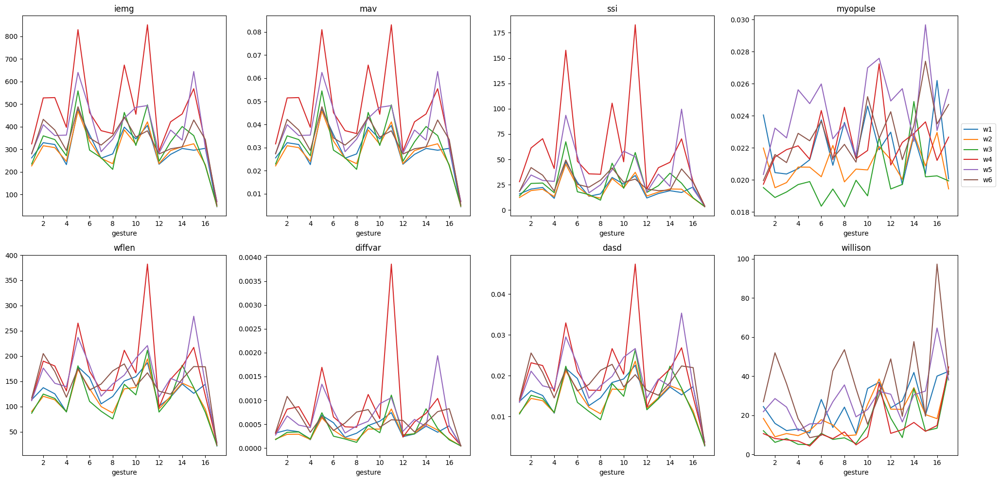

In [28]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session3.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session3.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session3.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session3.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session3.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session3.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session3.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

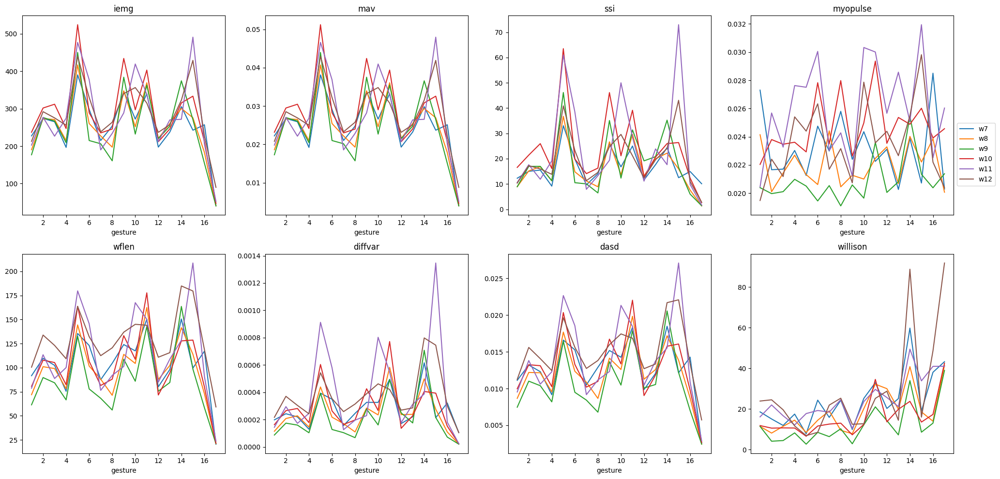

In [29]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

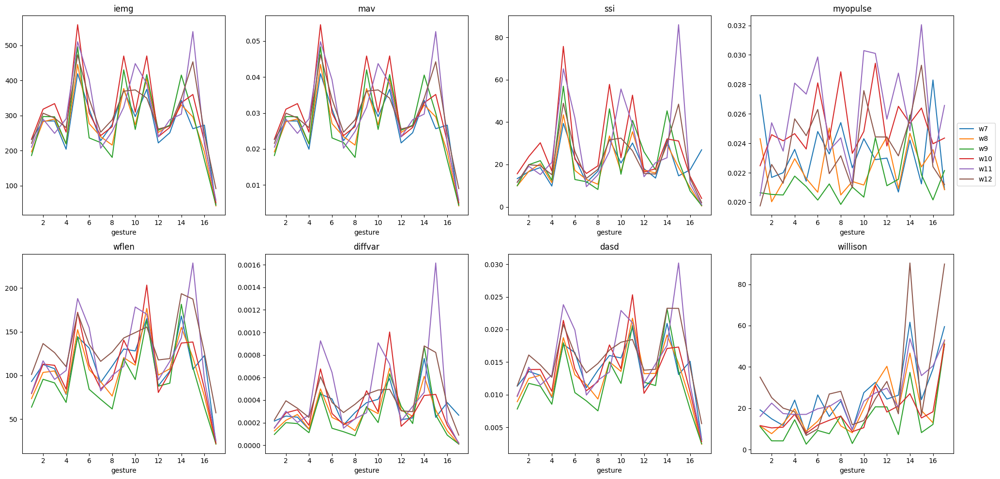

In [30]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session1.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session1.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session1.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session1.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session1.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session1.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session1.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

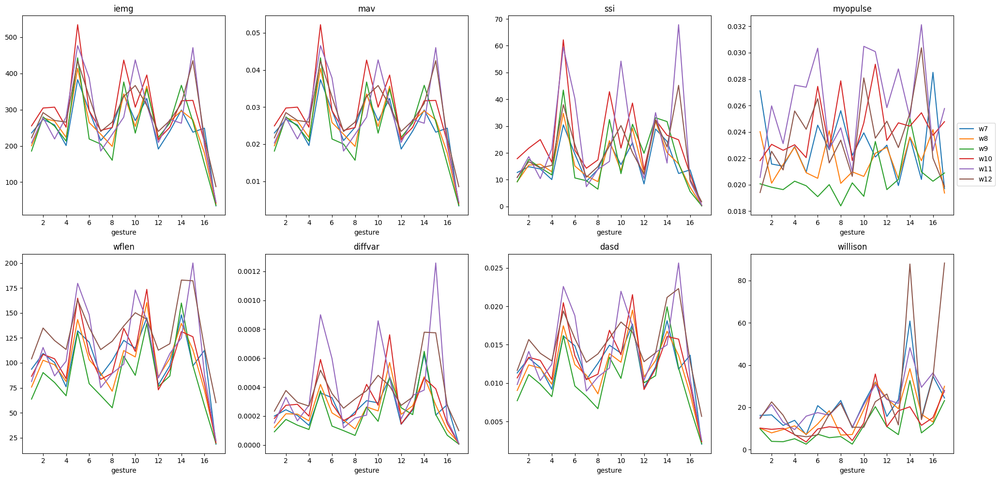

In [31]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session2.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session2.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session2.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session2.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session2.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session2.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session2.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

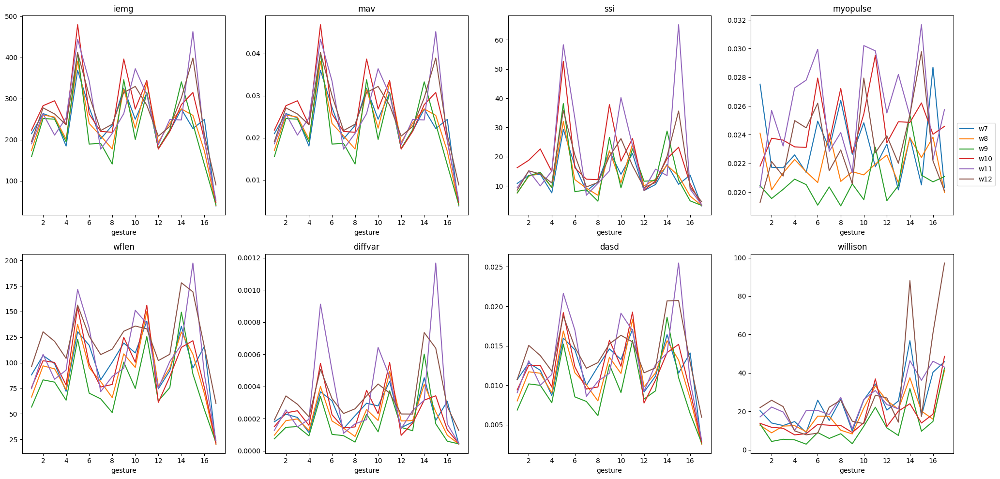

In [32]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session3.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session3.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session3.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session3.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session3.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session3.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session3.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('iemg')
axes[0][1].title.set_text('mav')
axes[0][2].title.set_text('ssi')
axes[0][3].title.set_text('myopulse')
axes[1][0].title.set_text('wflen')
axes[1][1].title.set_text('diffvar')
axes[1][2].title.set_text('dasd')
axes[1][3].title.set_text('willison')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

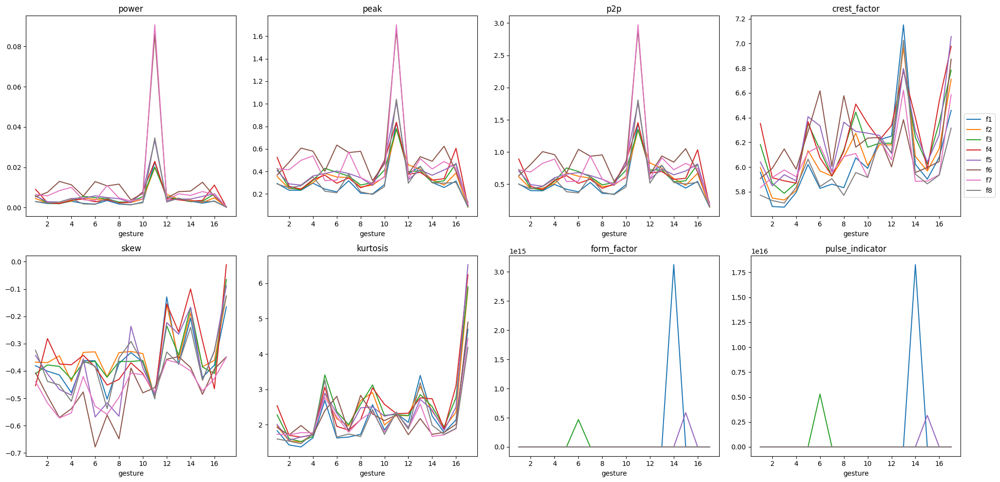

In [18]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, :8].plot(ax = axes[0][0])
avg_session.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

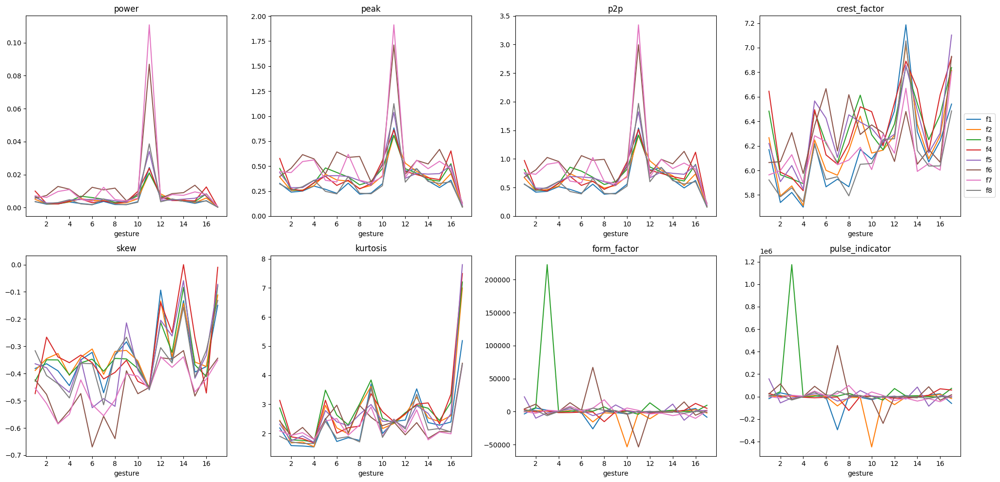

In [19]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, :8].plot(ax = axes[0][0])
avg_session1.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session1.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session1.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session1.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session1.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session1.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session1.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

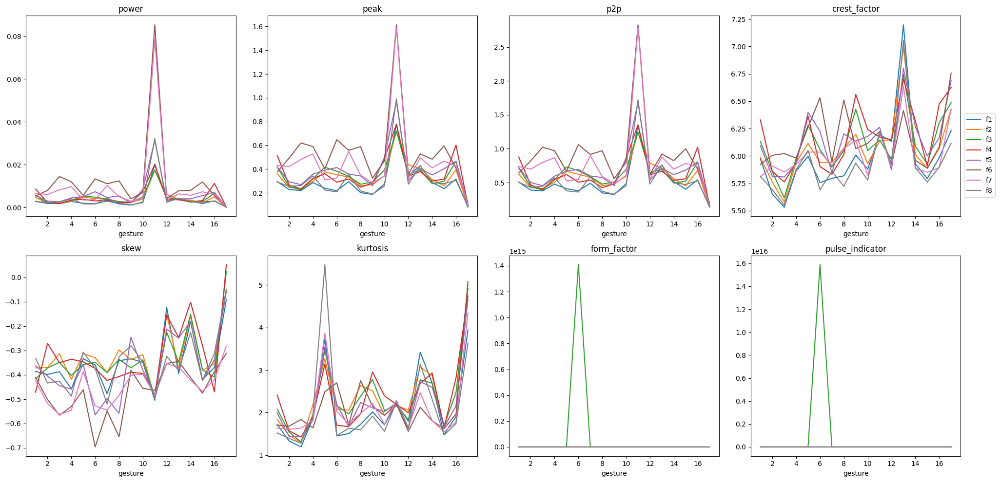

In [20]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, :8].plot(ax = axes[0][0])
avg_session2.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session2.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session2.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session2.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session2.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session2.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session2.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

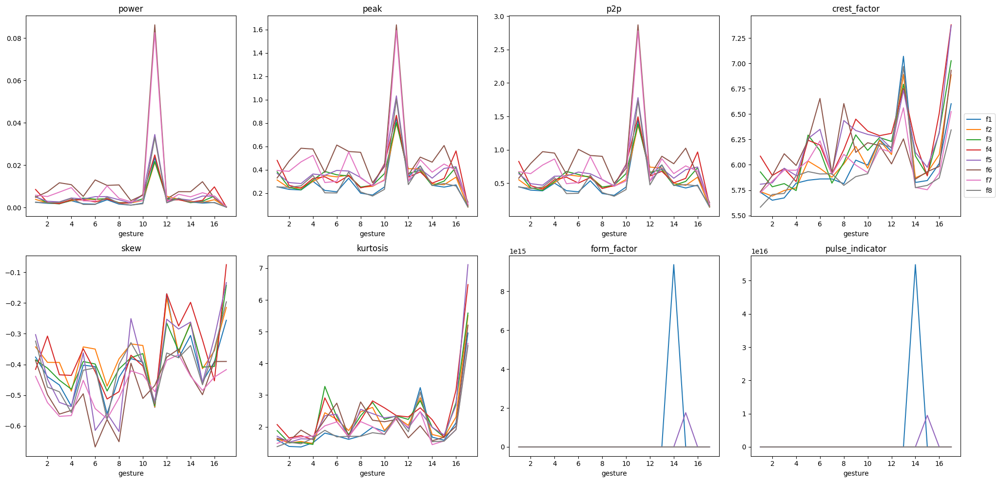

In [21]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, :8].plot(ax = axes[0][0])
avg_session3.iloc[:, 28:36].plot(ax = axes[0][1])
avg_session3.iloc[:, 56:64].plot(ax = axes[0][2])
avg_session3.iloc[:, 84:92].plot(ax = axes[0][3])
avg_session3.iloc[:, 112:120].plot(ax = axes[1][0])
avg_session3.iloc[:, 140:148].plot(ax = axes[1][1])
avg_session3.iloc[:, 168:176].plot(ax = axes[1][2])
avg_session3.iloc[:, 196:204].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring1, loc="center left", bbox_to_anchor=(1, 1.5))

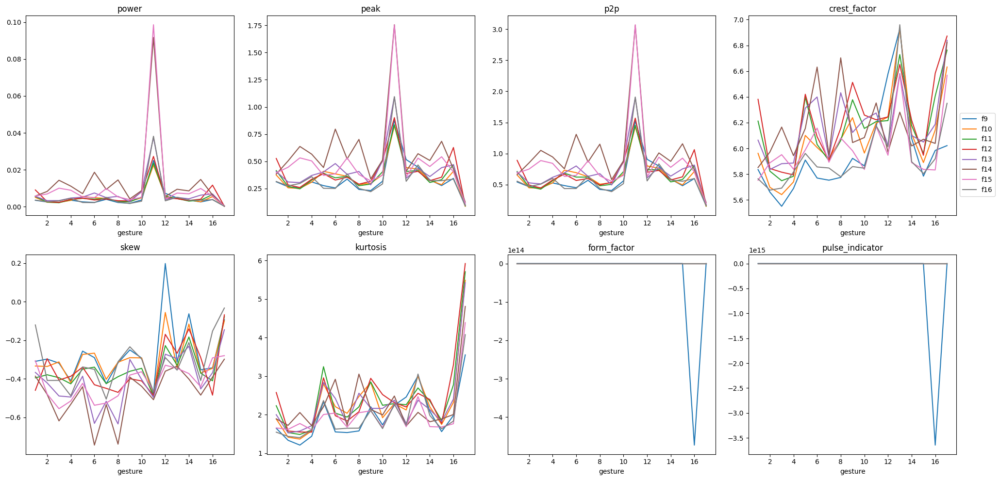

In [22]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

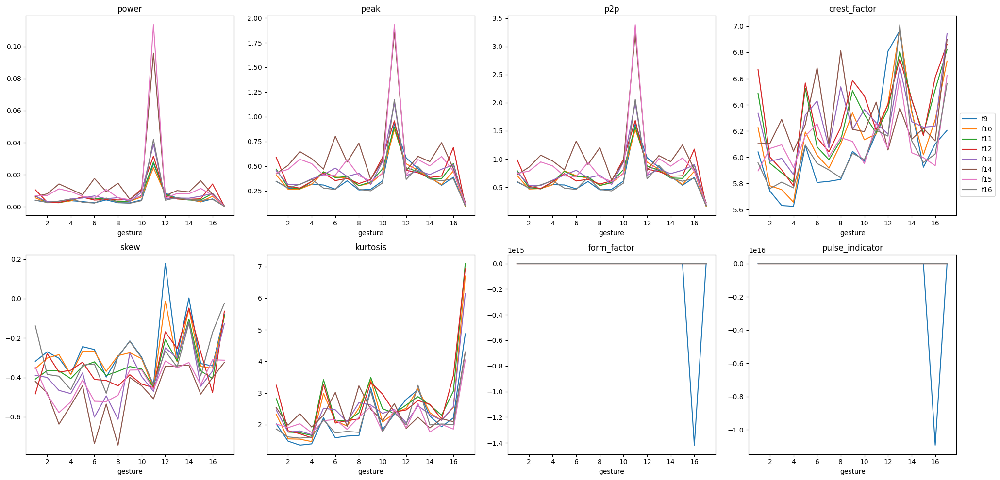

In [23]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session1.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session1.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session1.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session1.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session1.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session1.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session1.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

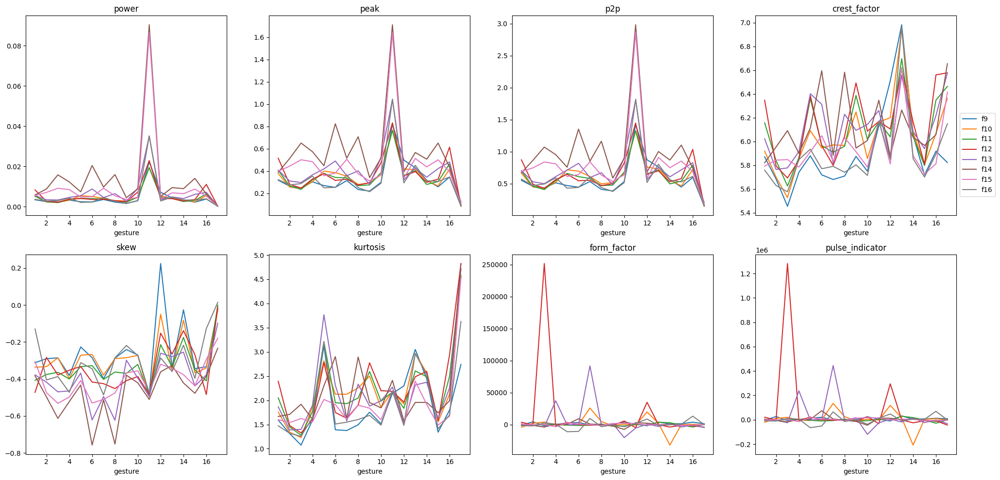

In [24]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session2.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session2.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session2.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session2.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session2.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session2.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session2.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

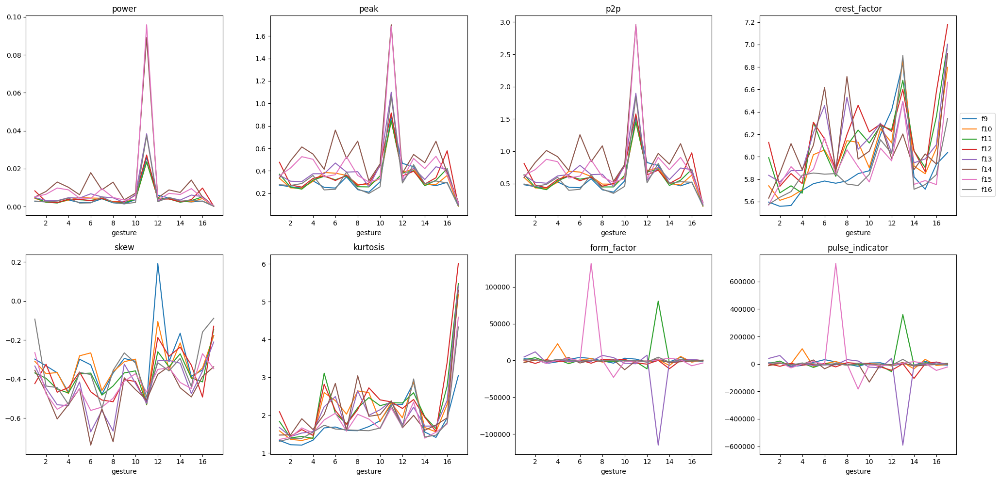

In [25]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, 8:16].plot(ax = axes[0][0])
avg_session3.iloc[:, 36:44].plot(ax = axes[0][1])
avg_session3.iloc[:, 64:72].plot(ax = axes[0][2])
avg_session3.iloc[:, 92:100].plot(ax = axes[0][3])
avg_session3.iloc[:, 120:128].plot(ax = axes[1][0])
avg_session3.iloc[:, 148:156].plot(ax = axes[1][1])
avg_session3.iloc[:, 176:184].plot(ax = axes[1][2])
avg_session3.iloc[:, 204:212].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_forearm_ring2, loc="center left", bbox_to_anchor=(1, 1.5))

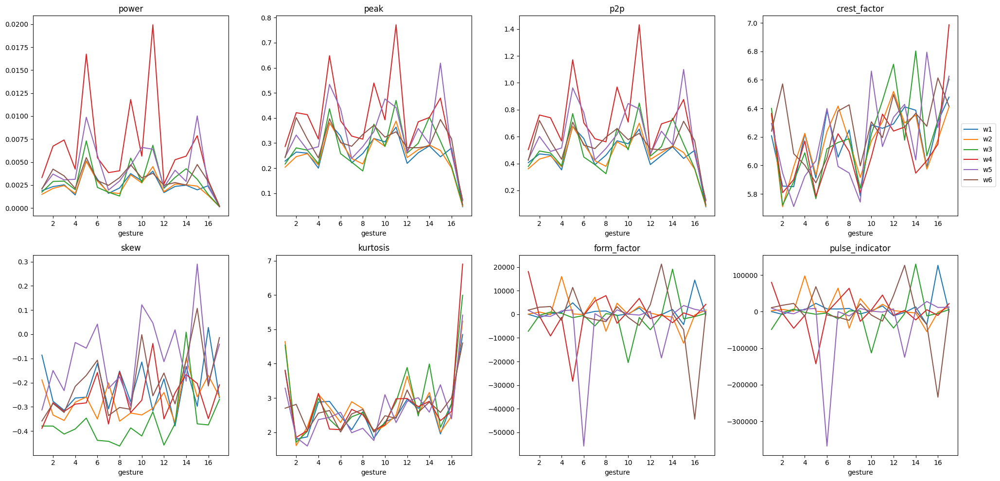

In [26]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

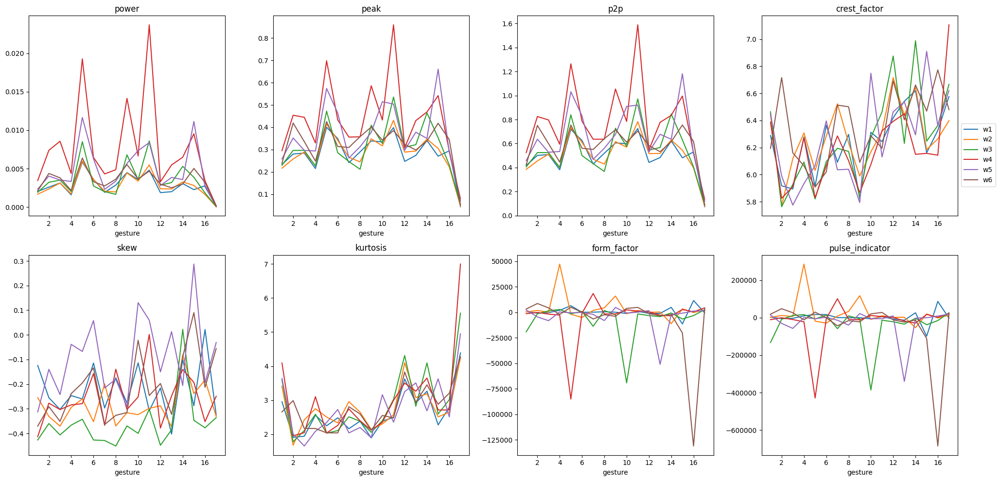

In [27]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session1.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session1.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session1.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session1.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session1.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session1.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session1.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

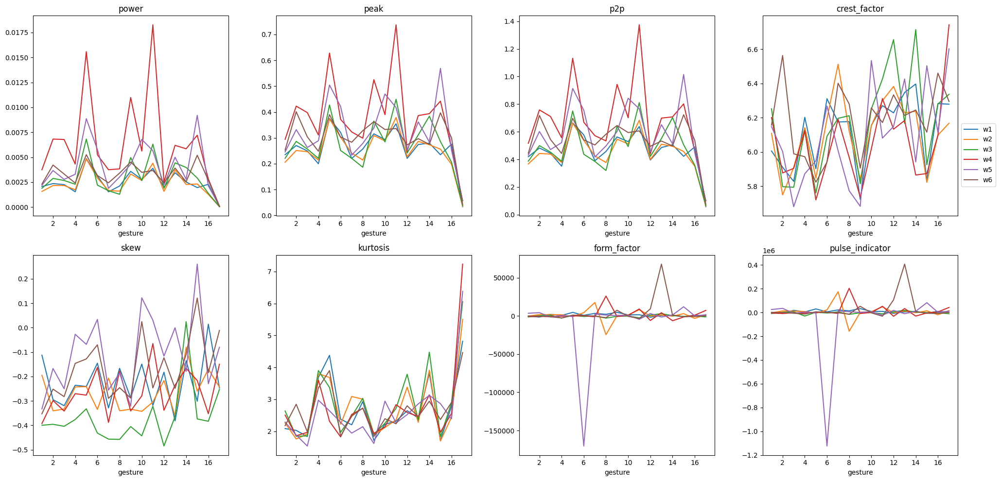

In [28]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session2.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session2.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session2.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session2.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session2.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session2.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session2.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

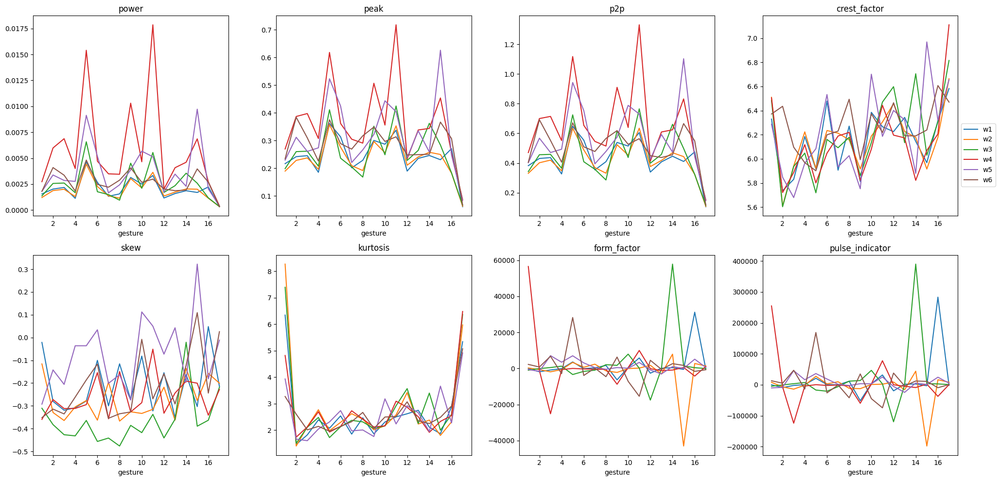

In [29]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, 16:22].plot(ax = axes[0][0])
avg_session3.iloc[:, 44:50].plot(ax = axes[0][1])
avg_session3.iloc[:, 72:78].plot(ax = axes[0][2])
avg_session3.iloc[:, 100:106].plot(ax = axes[0][3])
avg_session3.iloc[:, 128:134].plot(ax = axes[1][0])
avg_session3.iloc[:, 156:162].plot(ax = axes[1][1])
avg_session3.iloc[:, 184:190].plot(ax = axes[1][2])
avg_session3.iloc[:, 212:218].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring3, loc="center left", bbox_to_anchor=(1, 1.5))

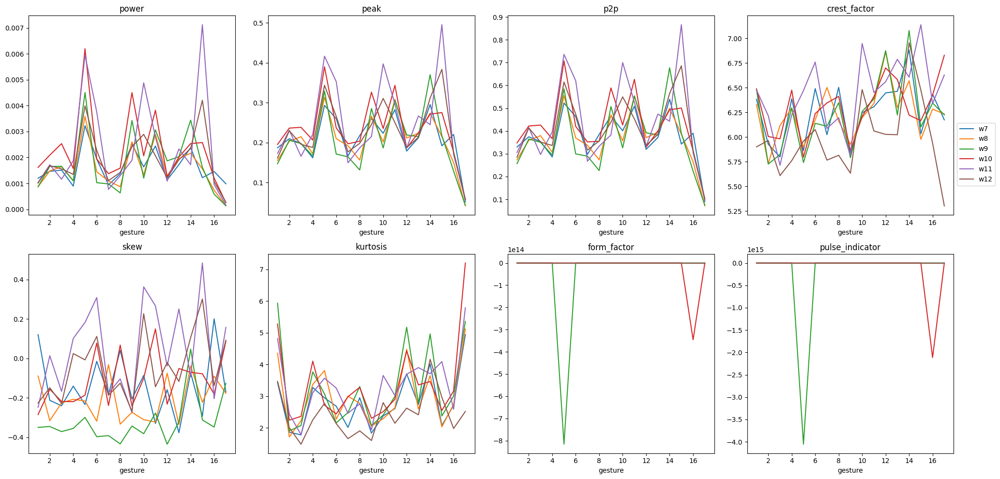

In [30]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

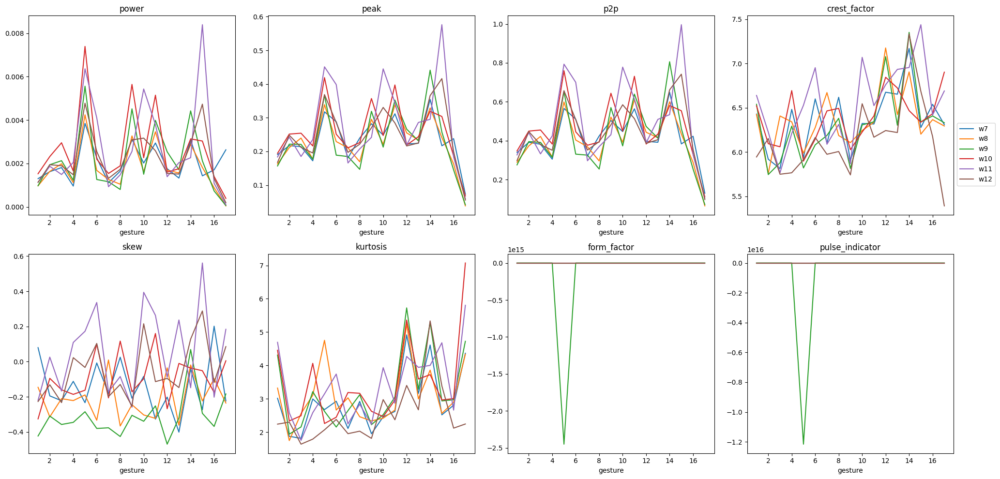

In [31]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session1.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session1.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session1.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session1.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session1.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session1.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session1.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session1.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

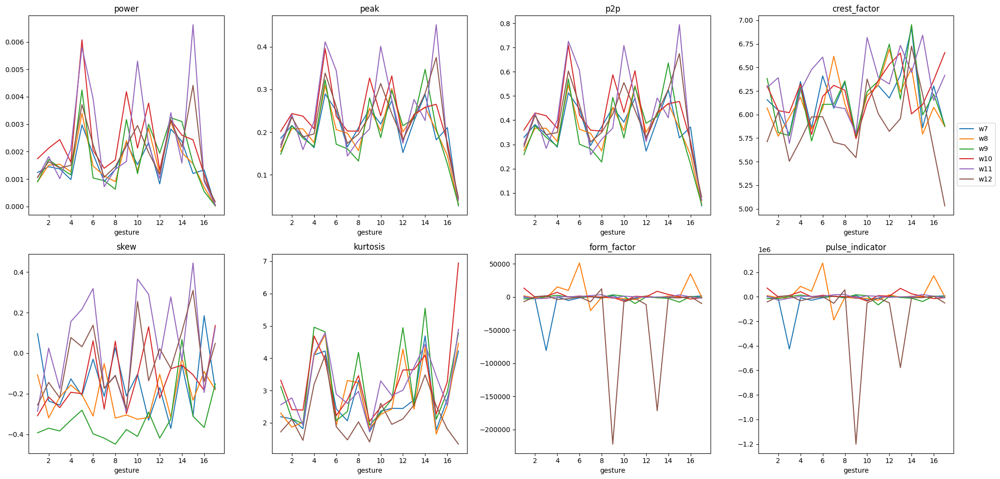

In [32]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session2.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session2.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session2.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session2.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session2.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session2.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session2.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session2.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))

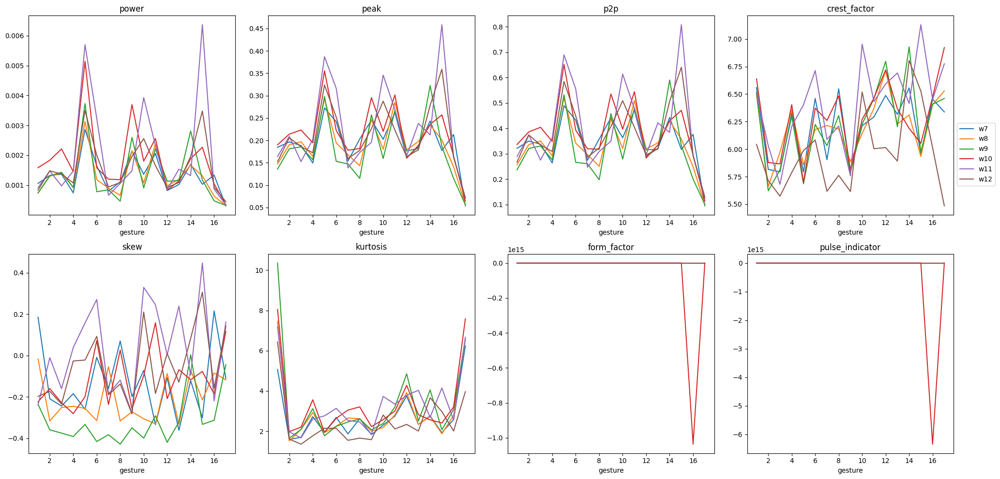

In [33]:
fig, axes = plt.subplots(2,4, figsize = (20,10))
avg_session3.iloc[:, 22:28].plot(ax = axes[0][0])
avg_session3.iloc[:, 50:56].plot(ax = axes[0][1])
avg_session3.iloc[:, 78:84].plot(ax = axes[0][2])
avg_session3.iloc[:, 106:112].plot(ax = axes[0][3])
avg_session3.iloc[:, 134:140].plot(ax = axes[1][0])
avg_session3.iloc[:, 162:168].plot(ax = axes[1][1])
avg_session3.iloc[:, 190:196].plot(ax = axes[1][2])
avg_session3.iloc[:, 218:].plot(ax = axes[1][3])

axes[0][0].title.set_text('power')
axes[0][1].title.set_text('peak')
axes[0][2].title.set_text('p2p')
axes[0][3].title.set_text('crest_factor')
axes[1][0].title.set_text('skew')
axes[1][1].title.set_text('kurtosis')
axes[1][2].title.set_text('form_factor')
axes[1][3].title.set_text('pulse_indicator')

axes[0][0].get_legend().set_visible(False)
axes[0][1].get_legend().set_visible(False)
axes[0][2].get_legend().set_visible(False)
axes[0][3].get_legend().set_visible(False)
axes[1][0].get_legend().set_visible(False)
axes[1][1].get_legend().set_visible(False)
axes[1][2].get_legend().set_visible(False)
axes[1][3].get_legend().set_visible(False)

fig.tight_layout()
plt.legend(labels = mylabels_wrist_ring4, loc="center left", bbox_to_anchor=(1, 1.5))